# Some imports

In [161]:
import pandas as pd
import pickle

from nltk.stem import WordNetLemmatizer

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import CountVectorizer

import os


# Constants

- Load and save Model functions

In [162]:
def save_model(object, file: str = "save.pkl"):
      
    with open(file, "wb") as f:
        pickle.dump(object, f, pickle.HIGHEST_PROTOCOL)
def load_model(file: str = "save.pkl"): 
    with open(file, "rb") as f:
        return pickle.load(f)

# Dataset
In this lab we use part of the 'Amazon_Unlocked_Mobile.csv' dataset published by Kaggle. The dataset contain the following information:

* book title
* Authors
* categories
* Rating
* Review title
* review summary
* Review score

We are mainly interested by the 'review/summary' (X) and by the 'review/score' (y)

The goal is to try to predict the Rating after reading the Reviews

![dataset/shape](https://i.imgur.com/9ELRD7G.png)


In [163]:
rating=pd.read_csv("Books_rating.csv")

rating.head()

,Id,Title,Price,User_id,profileName,review/helpfulness,review/score,review/time,review/summary,review/text
0,1882931173,Its Only Art If Its Well Hung!,NaN,AVCGYZL8FQQTD,"Jim of Oz ""jim-of-oz""",7/7,4.0,940636800,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...
1,0826414346,Dr. Seuss: American Icon,NaN,A30TK6U7DNS82R,Kevin Killian,10/10,5.0,1095724800,Really Enjoyed It,I don't care much for Dr. Seuss but after read...
2,0826414346,Dr. Seuss: American Icon,NaN,A3UH4UZ4RSVO82,John Granger,10/11,5.0,1078790400,Essential for every personal and Public Library,"If people become the books they read and if ""t..."
3,0826414346,Dr. Seuss: American Icon,NaN,A2MVUWT453QH61,"Roy E. Perry ""amateur philosopher""",7/7,4.0,1090713600,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D..."
4,0826414346,Dr. Seuss: American Icon,NaN,A22X4XUPKF66MR,"D. H. Richards ""ninthwavestore""",3/3,4.0,1107993600,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...


- Drop unused columns

In [164]:
rating=rating.drop(["Price","User_id","profileName","review/helpfulness","review/time"], axis=1)

## Add a column that sorts reviews into 'positive', 'negative', 'neutral' based on the rating assigned 'review/score'

In [165]:
def rating_scale(x):
    if x > 3:
        return 'positive'
    elif x < 3:
        return 'negative'
    else:
        return 'neutral'


rating['review/scale'] = rating['review/score'].apply(rating_scale)

# Affichez le DataFrame mis à jour
rating

,Id,Title,review/score,review/summary,review/text,review/scale
0,1882931173,Its Only Art If Its Well Hung!,4.0,Nice collection of Julie Strain images,This is only for Julie Strain fans. It's a col...,positive
1,0826414346,Dr. Seuss: American Icon,5.0,Really Enjoyed It,I don't care much for Dr. Seuss but after read...,positive
2,0826414346,Dr. Seuss: American Icon,5.0,Essential for every personal and Public Library,"If people become the books they read and if ""t...",positive
3,0826414346,Dr. Seuss: American Icon,4.0,Phlip Nel gives silly Seuss a serious treatment,"Theodore Seuss Geisel (1904-1991), aka &quot;D...",positive
4,0826414346,Dr. Seuss: American Icon,4.0,Good academic overview,Philip Nel - Dr. Seuss: American IconThis is b...,positive
...,...,...,...,...,...,...
2999995,B000NSLVCU,The Idea of History,4.0,Difficult,"This is an extremely difficult book to digest,...",positive
2999996,B000NSLVCU,The Idea of History,4.0,Quite good and ahead of its time occasionally,This is pretty interesting. Collingwood seems ...,positive
2999997,B000NSLVCU,The Idea of History,4.0,Easier reads of those not well versed in histo...,"This is a good book but very esoteric. ""What i...",positive
2999998,B000NSLVCU,The Idea of History,5.0,"Yes, it is cheaper than the University Bookstore","My daughter, a freshman at Indiana University,...",positive


In [166]:
def print_scale(rating):
    print((rating['review/scale']== 'positive').sum())
    print((rating['review/scale'] == 'negative').sum())
    print((rating['review/scale']== 'neutral').sum())
    
print_scale(rating)


2392959
352746
254295


# Data Preprocessing
create a dataframe with a fair number of data in each class

In [169]:
rating_all=rating
rating=pd.concat([rating.head(50000),rating.tail(50000)])


In [137]:
condition1 = rating['review/scale'] == "negative"
condition2 = rating['review/scale'] == "neutral"
selection = rating.loc[(condition1 | condition2)]

for i in range(5):
    ranting_melange= pd.concat([rating,selection])

 
# Mélanger les lignes en utilisant sample avec frac
rating_f = ranting_melange.sample(frac=1, random_state=42)
print(rating_f)


                 Id                                              Title  \
2997659  1851773789              Dress in Detail From Around the World   
149      B0000CJHIO                               Hunting The Hard Way   
2999115  B000P91JYW                                          Jane Eyre   
116      B000NKGYMK                                   Alaska Sourdough   
2999706  0072228997         Ultimate Game Design: Building Game Worlds   
...             ...                                                ...   
2997630  0961852003                    Mrs. Murphy's Swedish Cook Book   
2997794  0253302803  An African World: The Basongye Village of Lupu...   
860      B000MCKQRS  Cruel and Unusual (G K Hall Large Print Book S...   
41       0595344550                      Whispers of the Wicked Saints   
2999674  B000P91JYW                                          Jane Eyre   

         review/score                                     review/summary  \
2997659           2.0              

### Equalize the number of instances of each class

In [103]:

dataset = pd.concat([rating_f[(rating_f['review/scale'] == 'positive')].head(20000),rating_f[(rating_f['review/scale'] == 'negative')].head(20000),rating_f[(rating_f['review/scale'] == 'neutral')].head(10000)])

dataset_rating=pd.concat([rating_f[(rating_f['review/score'] == 1)].head(10000),rating_f[(rating_f['review/score'] == 2)].head(10000),rating_f[(rating_f['review/score'] == 3)].head(10000),rating_f[(rating_f['review/score'] == 4)].head(10000),rating_f[(rating_f['review/score'] == 5)].head(10000)])

In [104]:
print_scale(dataset)

20000
7372
5332


In [ ]:
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    return ' '.join([lemmatizer.lemmatize(word) for word in word_tokenize(text)])

#Applying lemmatization to the "text review" column
dataset["review/text"] = dataset["text eview/text"].apply(lemmatize_text)
dataset["review/score"] = dataset["review/score"].apply(lemmatize_text)

In [105]:
rating= dataset
X = rating['review/text'].astype(str)

y = rating['review/scale']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(26163,)
(6541,)
(26163,)
(6541,)


### TF-IDF text vectorization X_train and X_test

In [106]:
tfidf_vectorizer = TfidfVectorizer()

# Vectoriser le dataset de train
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
# Vectoriser le dataset de test
X_test_tfidf = tfidf_vectorizer.transform(X_test)

# Models training
## guess the scale from the (text review)
### testing SVC model with kernel function 'rbf'

In [107]:

# Créer un modèle SVM RBF
svm_model = SVC(kernel='rbf')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données d'entraînement:\n", classification_report_train)

Rapport de classification pour les données d'entraînement:
               precision    recall  f1-score   support

    negative       1.00      0.99      0.99      5888
     neutral       1.00      0.96      0.98      4278
    positive       0.99      1.00      0.99     15997

    accuracy                           0.99     26163
   macro avg       0.99      0.98      0.99     26163
weighted avg       0.99      0.99      0.99     26163



- Results

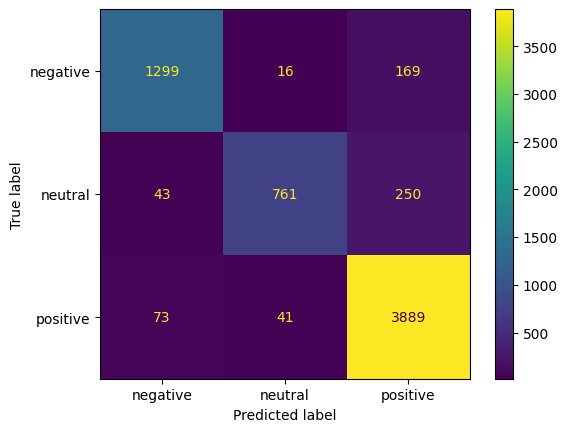

In [108]:
# Print/plot the confusion matrix
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

 Display the false predicted results

In [109]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: We used this book to study for the Texas State Journeyman Plumbers license test and no question in this book was asked on the test. Further, we could not find the answer in this book for any question we remembered from the test. We were greatly disapointed.
the true rating: negative
the model rating: positive
the review: There seems to be a good story lurking over all that old-fashioned, overly lush prose. The main character takes a walk through a garden and it seems like every leaf of every plant and every feather of every bird is described, as well as way too many references to &quot;the reader&quot; (me, I guess). Yet underneath it all there is a good story, a retelling of Biblical events of Jesus' life from the point of view of a man driven by anger. It is worth reading, but be prepared to skim over the boring passages. Or better yet, just see the movie.
the true rating: neutral
the model rating: positive
the review: Nothing wrong with the actual product, just couldn't 

### testing SVC model with kernel function 'linear'

In [110]:
# Créer un modèle SVM linéaire
svm_model = SVC(kernel='linear')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

#save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données de test:\n", classification_report_train)

Rapport de classification pour les données d'entraînement:
               precision    recall  f1-score   support

    negative       0.93      0.92      0.92      5888
     neutral       0.92      0.77      0.84      4278
    positive       0.94      0.98      0.96     15997

    accuracy                           0.93     26163
   macro avg       0.93      0.89      0.91     26163
weighted avg       0.93      0.93      0.93     26163



- Results

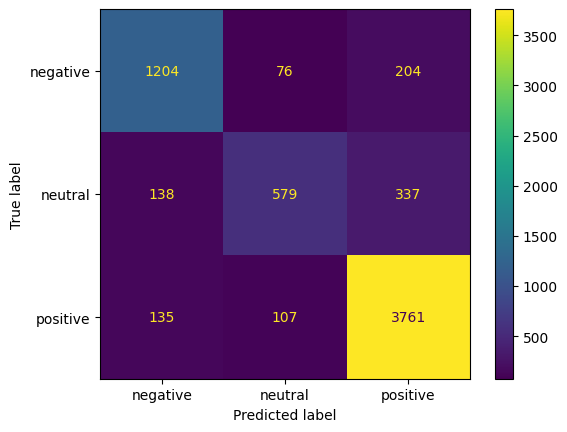

In [111]:
# Print/plot the confusion matrix
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

- Display the false predicted results 

In [112]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: This was my first Asimov book. Based on the reviews I've seen for this series, I was expecting a more captivating story. However, another reviewer's comments has convinced me not to give up yet. That reviewer notes that this is an early work of Asimov's and the sequels are better. I'll give the next one a try.
the true rating: neutral
the model rating: positive
the review: I had to read this for a women's lit class. Book came very very quickly and in PERFECT shape and has large easy-to-read font. The actual book itself could have been a lot more interesting, but that typically happens when reading classics. Would I read it for pleasure? No. But it is an insightful book, even if its hard to read at times.
the true rating: neutral
the model rating: positive
the review: Generally speaking a great book if you are not familiar with management accounting and turning heaps of information into valuable reports for your top management group. No doubt about it: This book will provide

 ### Naive Bayes classifier

In [113]:
model = make_pipeline(TfidfVectorizer(), MultinomialNB())

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print("\nClassification Report:")
print(classification_report(y_test, y_pred))



Classification Report:
              precision    recall  f1-score   support

    negative       1.00      0.04      0.07      1484
     neutral       1.00      0.00      0.00      1054
    positive       0.62      1.00      0.76      4003

    accuracy                           0.62      6541
   macro avg       0.87      0.35      0.28      6541
weighted avg       0.77      0.62      0.48      6541



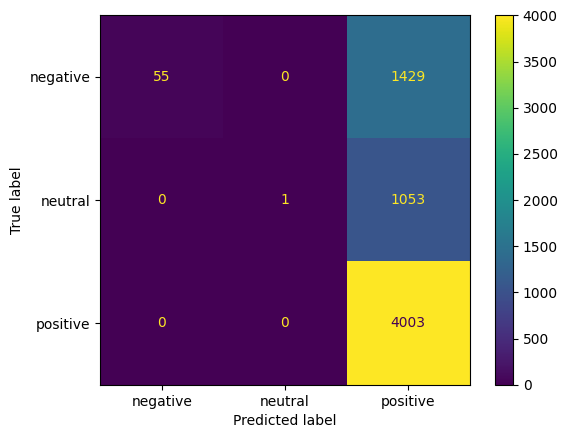

In [114]:
# Print/plot the confusion matrix
y_pred_test = model.predict(X_test)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()


In [116]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: I was expecting more...
the true rating: neutral
the model rating: positive
the review: Wandering with the Wapshots
the true rating: neutral
the model rating: positive
the review: could've been worse
the true rating: neutral
the model rating: positive
the review: Definitely Not For Women!
the true rating: negative
the model rating: positive
the review: I Certainly Expected More . . .
the true rating: negative
the model rating: positive
the review: Not a good study guide
the true rating: negative
the model rating: positive
the review: Back to basics
the true rating: negative
the model rating: positive
the review: Good, but over-written
the true rating: neutral
the model rating: positive
the review: How Old Was Michaels When She Wrote This One?
the true rating: negative
the model rating: positive
the review: It might be easier to be green than you think!
the true rating: neutral
the model rating: positive
the review: Waste of time;Stick to Robot novels.
the true rating: negat

## guess the scale from the (summary) of the review

In [115]:
rating=dataset
X = rating['review/summary'].astype(str)
y = rating['review/scale']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(26163,)
(6541,)
(26163,)
(6541,)


### apply TF-IDF text vectorization X_train and X_test

In [117]:
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)  # Use the same vectorizer for consistency


## Models training
### guess the scale from the summery review
#### testing SVC model with kernel function 'rbf'

In [118]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)

# Saving the trained model
save_model(svm_model, "save2.pkl")

# Displaying the classification report for the training data
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.95      0.93      0.94      5888
     neutral       0.94      0.81      0.87      4278
    positive       0.94      0.99      0.96     15997

    accuracy                           0.95     26163
   macro avg       0.95      0.91      0.93     26163
weighted avg       0.95      0.95      0.94     26163



- Results

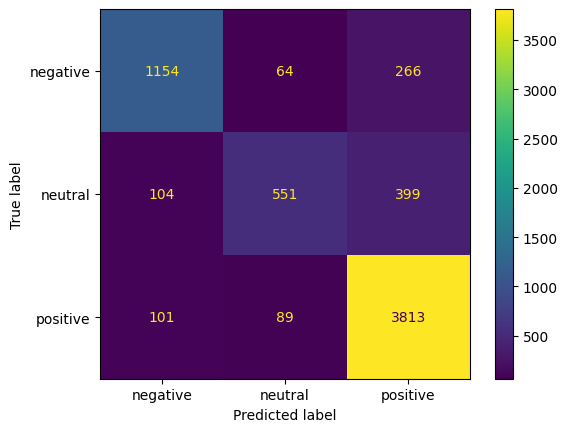

In [119]:
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

Display the false predicted results

In [120]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Wandering with the Wapshots
the true rating: neutral
the model rating: positive
the review: Definitely Not For Women!
the true rating: negative
the model rating: neutral
the review: Storyline ....
the true rating: positive
the model rating: neutral
the review: Not a good study guide
the true rating: negative
the model rating: neutral
the review: Back to basics
the true rating: negative
the model rating: positive
the review: It might be easier to be green than you think!
the true rating: neutral
the model rating: positive
the review: disappointing read
the true rating: neutral
the model rating: negative
the review: just lost interest 3/4 way through
the true rating: neutral
the model rating: negative
the review: Incredibly confusing; have a dictionary on hand!
the true rating: negative
the model rating: positive
the review: Not a manual
the true rating: positive
the model rating: negative
the review: brand new book
the true rating: neutral
the model rating: positive
the revi

In [121]:
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)

# Saving the trained model
save_model(svm_model, "save2.pkl")

# Displaying the classification report for the training data
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.84      0.80      0.82      5888
     neutral       0.83      0.53      0.64      4278
    positive       0.86      0.96      0.91     15997

    accuracy                           0.85     26163
   macro avg       0.84      0.76      0.79     26163
weighted avg       0.85      0.85      0.85     26163



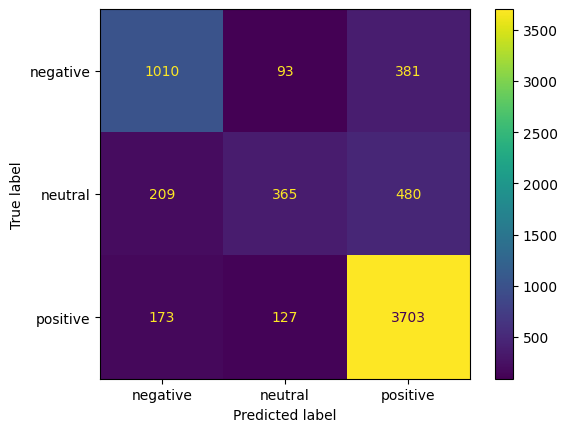

In [122]:
#svm_model= load_model("save2.pkl")
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

In [123]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Wandering with the Wapshots
the true rating: neutral
the model rating: positive
the review: Definitely Not For Women!
the true rating: negative
the model rating: neutral
the review: Storyline ....
the true rating: positive
the model rating: neutral
the review: I Certainly Expected More . . .
the true rating: negative
the model rating: positive
the review: Not a good study guide
the true rating: negative
the model rating: neutral
the review: Back to basics
the true rating: negative
the model rating: positive
the review: It might be easier to be green than you think!
the true rating: neutral
the model rating: positive
the review: disappointing read
the true rating: neutral
the model rating: negative
the review: just lost interest 3/4 way through
the true rating: neutral
the model rating: negative
the review: a need to read Hamlet
the true rating: positive
the model rating: negative
the review: Not a manual
the true rating: positive
the model rating: negative
the review: brand

### MLPClassifier

In [124]:
# Create an MLPClassifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, ), max_iter=100, random_state=42,early_stopping=True,activation='tanh')

# Train the classifier
mlp_classifier.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred = mlp_classifier.predict(X_test_tfidf)

# Evaluate the accuracy

classification_report_train = classification_report(y_test, y_pred)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.75      0.77      0.76      1484
     neutral       0.60      0.60      0.60      1054
    positive       0.88      0.87      0.87      4003

    accuracy                           0.80      6541
   macro avg       0.74      0.75      0.75      6541
weighted avg       0.81      0.80      0.81      6541



In [146]:

# Make predictions on the test set
y_pred_test = mlp_classifier.predict(X_test_tfidf)

# Calculate the confusion matrix
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative", "neutral", "positive"])
disp.plot()

ValueError: Mix of label input types (string and number)

In [ ]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

# Text vectorization using OneHotEncoder

In [97]:
import pandas as pd
import pickle
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.svm import SVC
from sklearn.metrics import classification_report
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import CountVectorizer
rating=pd.read_csv("Books_rating.csv")

rating.head()
rating=rating.drop(["Price","User_id","profileName","review/helpfulness","review/time"], axis=1)

def rating_scale(x):
    if x > 3:
        return 'positive'
    elif x < 3:
        return 'negative'
    else:
        return 'neutral'


rating['review/scale'] = rating['review/score'].apply(rating_scale)

# Affichez le DataFrame mis à jour
rating
def print_scale(rating):
    print((rating['review/scale']== 'positive').sum())
    print((rating['review/scale'] == 'negative').sum())
    print((rating['review/scale']== 'neutral').sum())
    
print_scale(rating)

rating_all=rating
rating=pd.concat([rating.head(10000),rating.tail(25000)])

print_scale(rating)
condition1 = rating['review/scale'] == "negative"
condition2 = rating['review/scale'] == "neutral"
selection = rating.loc[(condition1 | condition2)]

for i in range(5):
    ranting_melange= pd.concat([rating,selection])
# Mélanger les lignes en utilisant sample avec frac
rating_f = ranting_melange.sample(frac=1, random_state=42)

# garder uniquement les 35000 lignes pour 'positive' dans le but d'équilibrer les données
dataset = pd.concat([rating[(rating['review/scale'] == 'positive')].head(20000),rating[(rating['review/scale'] == 'negative')].head(20000),rating[(rating['review/scale'] == 'neutral')].head(20000)])
print_scale(dataset)
rating= dataset
X = rating['review/text'].astype(str)

y = rating['review/scale']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

2392959
352746
254295
28648
3686
2666
20000
3686
2666
(21081,)
(5271,)
(21081,)
(5271,)


In [100]:
class sklearn.preprocessing.OneHotEncoder(*, categories='auto', drop=None, sparse_output=True)
# Create a pipeline with OneHotEncoder and MultinomialNB
model = make_pipeline(
    OneHotEncoder(handle_unknown='ignore'),
    MultinomialNB()
)

# Train the model on the training data
model.fit(X_train.values.reshape(-1, 1), y_train)

# Predict the classes on the test data
y_pred = model.predict(X_test.values.reshape(-1, 1))

# Print the classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))



Classification Report:
              precision    recall  f1-score   support

    negative       1.00      0.00      0.01       723
     neutral       1.00      0.00      0.00       513
    positive       0.77      1.00      0.87      4035

    accuracy                           0.77      5271
   macro avg       0.92      0.33      0.29      5271
weighted avg       0.82      0.77      0.67      5271



# Models training
## guess the rating from the text review
### testing SVC model with kernel function 'rbf'

In [ ]:


# Créer un modèle SVM linéaire
svm_model = SVC(kernel='rbf')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données de test:\n", classification_report_train)

Rapport de classification pour les données d'entraînement:
               precision    recall  f1-score   support

    negative       0.97      0.96      0.97     15986
     neutral       0.95      0.96      0.95     15977
    positive       0.98      0.97      0.97     16037

    accuracy                           0.96     48000
   macro avg       0.96      0.96      0.96     48000
weighted avg       0.96      0.96      0.96     48000



- Results

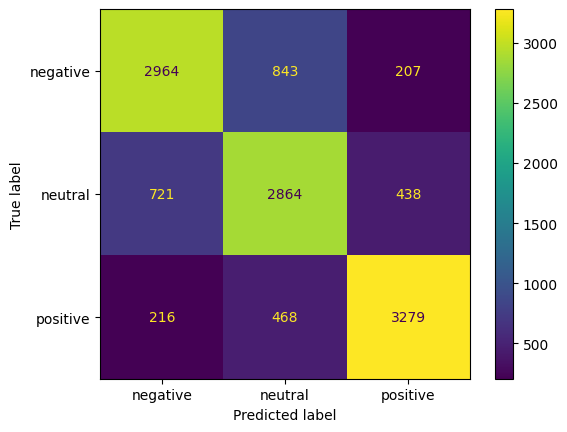

In [ ]:
# Print/plot the confusion matrix


y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

- Display the false predicted results

In [ ]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: _Shadow of the Lion_ (hereafter referred to as SoL) is indeed related to Merovingen Nights, although SoL's acknowledgements may not mention it, but it's not a simple recycle.Once upon a time (1980s), the Merovingen Nights series, hereafter referred to as MN - 1 novel and 7 anthologies - was set in the city of Merovingen (a Venice-like city of canals) on Merovin, a world in Cherryh's Union/Alliance universe cut off from the rest of humanity and frozen at a pre-starflight level of technology. Cherryh introduced the framework of the city and some of the star characters in the novel _Angel with the Sword_. The series regrettably stopped at anthology #7 and passed out of print.Moving on to _Shadow of the Lion_ (SoL), we have an alternate universe wherein the breakpoint was the conversion of Hypatia (last Librarian of Alexandria in our timeline) to Christianity. (This information is provided gently early on, via a character ducking into a church during a rainstorm, looking at the

### testing SVC model with kernel function 'linear'

In [ ]:


# Créer un modèle SVM linéaire
svm_model = SVC(kernel='linear')

# Entraîner le modèle sur les représentations vectorielles d'entraînement
svm_model.fit(X_train_tfidf, y_train)

# Prédire les classes sur les représentations d'entraînement
y_pred_train = svm_model.predict(X_train_tfidf)

save_model(svm_model)

# Afficher le rapport de classification pour les données d'entraînement
classification_report_train = classification_report(y_train, y_pred_train)
print("Rapport de classification pour les données de test:\n", classification_report_train)

Rapport de classification pour les données d'entraînement:
               precision    recall  f1-score   support

    negative       0.87      0.86      0.87     15986
     neutral       0.83      0.84      0.83     15977
    positive       0.91      0.91      0.91     16037

    accuracy                           0.87     48000
   macro avg       0.87      0.87      0.87     48000
weighted avg       0.87      0.87      0.87     48000



- Results

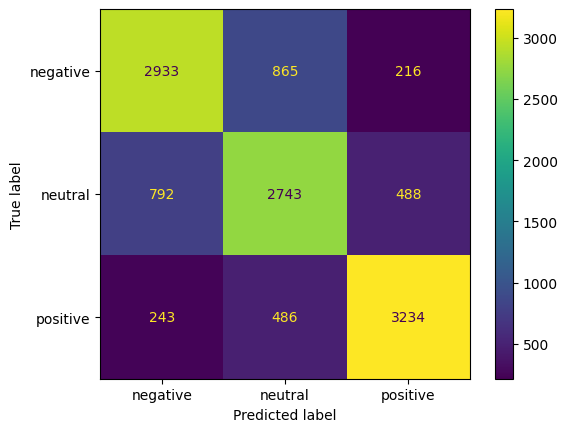

In [ ]:
# Print/plot the confusion matrix


y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

- Display the false predicted results 

In [ ]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: _Shadow of the Lion_ (hereafter referred to as SoL) is indeed related to Merovingen Nights, although SoL's acknowledgements may not mention it, but it's not a simple recycle.Once upon a time (1980s), the Merovingen Nights series, hereafter referred to as MN - 1 novel and 7 anthologies - was set in the city of Merovingen (a Venice-like city of canals) on Merovin, a world in Cherryh's Union/Alliance universe cut off from the rest of humanity and frozen at a pre-starflight level of technology. Cherryh introduced the framework of the city and some of the star characters in the novel _Angel with the Sword_. The series regrettably stopped at anthology #7 and passed out of print.Moving on to _Shadow of the Lion_ (SoL), we have an alternate universe wherein the breakpoint was the conversion of Hypatia (last Librarian of Alexandria in our timeline) to Christianity. (This information is provided gently early on, via a character ducking into a church during a rainstorm, looking at the

## guess the scale from the summary (title) of the review

In [ ]:
rating=dataset
X = rating['review/summary'].astype(str)
y = rating['review/scale']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(48000,)
(12000,)
(48000,)
(12000,)


In [ ]:
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)  # Use the same vectorizer for consistency


In [ ]:
svm_model = SVC(kernel='rbf')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)

# Saving the trained model
save_model(svm_model, "save2.pkl")

# Displaying the classification report for the training data
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Test Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.90      0.90      0.90     15986
     neutral       0.88      0.87      0.87     15977
    positive       0.92      0.92      0.92     16037

    accuracy                           0.90     48000
   macro avg       0.90      0.90      0.90     48000
weighted avg       0.90      0.90      0.90     48000



- Results

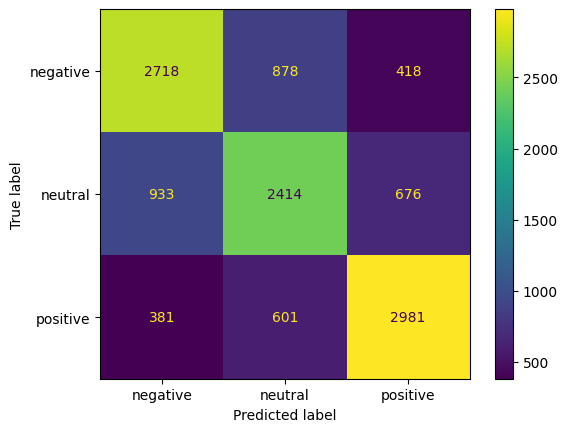

In [ ]:
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

- Display the false predicted results

In [ ]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Not just cheap propaganda!
the true rating: 5.0
the model rating: 1.0
the review: Scurrilous is not a strong enough adjective
the true rating: 1.0
the model rating: 3.0
the review: (4.5)A thoughtful assessment of a tortured life
the true rating: 4.0
the model rating: 5.0
the review: If you need a Merovingen Nights fix...
the true rating: 4.0
the model rating: 3.0
the review: A Women Struggling to Become Accepted
the true rating: 5.0
the model rating: 1.0
the review: Disappointing
the true rating: 1.0
the model rating: 2.0
the review: Too Many Tears.
the true rating: 2.0
the model rating: 3.0
the review: A-Square reloading manual
the true rating: 3.0
the model rating: 2.0
the review: A fast, but mostly unpleasant read
the true rating: 2.0
the model rating: 3.0
the review: Disappointing
the true rating: 1.0
the model rating: 2.0
the review: Robert Parker rips off himself!
the true rating: 1.0
the model rating: 3.0
the review: not what I expected...
the true rating: 2.0
the mo

In [ ]:
print(y_train)

2752288     neutral
2799001    negative
16919      positive
2774611    negative
95807      negative
             ...   
2818412     neutral
2794525    negative
1052       positive
19635      positive
2842817     neutral
Name: review/scale, Length: 48000, dtype: object


In [ ]:
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)

# Saving the trained model
save_model(svm_model, "save2.pkl")

# Displaying the classification report for the training data
classification_report_train = classification_report(y_train, y_pred_train)
print("Classification Report for Training Data:\n", classification_report_train)

Classification Report for Training Data:
               precision    recall  f1-score   support

    negative       0.78      0.78      0.78     15986
     neutral       0.74      0.71      0.72     15977
    positive       0.82      0.83      0.83     16037

    accuracy                           0.78     48000
   macro avg       0.78      0.78      0.78     48000
weighted avg       0.78      0.78      0.78     48000



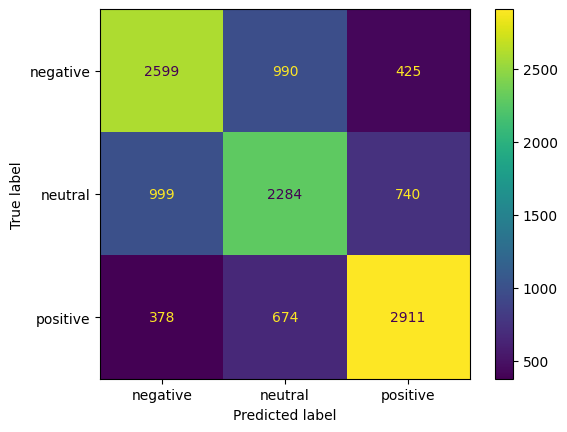

In [ ]:
svm_model= load_model("save2.pkl")
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative","neutral","positive"])

disp.plot()

In [ ]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Not just cheap propaganda!
the true rating: positive
the model rating: negative
the review: Scurrilous is not a strong enough adjective
the true rating: negative
the model rating: neutral
the review: A good classic for children
the true rating: neutral
the model rating: positive
the review: If you need a Merovingen Nights fix...
the true rating: positive
the model rating: negative
the review: An Insightful Disappointment
the true rating: negative
the model rating: neutral
the review: A Women Struggling to Become Accepted
the true rating: positive
the model rating: negative
the review: A-Square reloading manual
the true rating: neutral
the model rating: negative
the review: A fast, but mostly unpleasant read
the true rating: negative
the model rating: neutral
the review: THE HOUSE GETS BIGGER BY ONE
the true rating: neutral
the model rating: positive
the review: I regret not writing this review while he was alive...
the true rating: positive
the model rating: neutral
the rev

In [ ]:
# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)
X_test_tfidf = tfidf_vectorizer.transform(X_test)  # Use the same vectorizer for consistency

# Create an MLPClassifier
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, ), max_iter=500, random_state=42)

# Train the classifier
mlp_classifier.fit(X_train_tfidf, y_train)

# Make predictions on the test set
y_pred = mlp_classifier.predict(X_test_tfidf)

# Evaluate the accuracy

classification_report_train = classification_report(y_train, y_pred)
print("Classification Report for Training Data:\n", classification_report_train)

In [ ]:
svm_model = load_model("save2.pkl")

# Make predictions on the test set
y_pred_test = svm_model.predict(X_test_tfidf)

# Calculate the confusion matrix
conf_matrix_test = confusion_matrix(y_test, y_pred_test)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test, display_labels=["negative", "neutral", "positive"])
disp.plot()

## Guess the rating from the text review

In [140]:
rating=dataset_rating

X = rating['review/summary'].astype(str)

y = rating['review/score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(26163,)
(6541,)
(26163,)
(6541,)


In [141]:
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Vectoriser le dataset de test
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [142]:
# SVM Model
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)


# Displaying the classification report for the training data
classification_report = classification_report(y_train, y_pred_train)
print("Classification Report for Test Data:\n", classification_report)

Classification Report for Training Data:
               precision    recall  f1-score   support

         1.0       0.79      0.76      0.77      3435
         2.0       0.80      0.55      0.65      2453
         3.0       0.73      0.66      0.69      4278
         4.0       0.73      0.21      0.33      3821
         5.0       0.72      0.96      0.82     12176

    accuracy                           0.74     26163
   macro avg       0.75      0.63      0.65     26163
weighted avg       0.74      0.74      0.71     26163



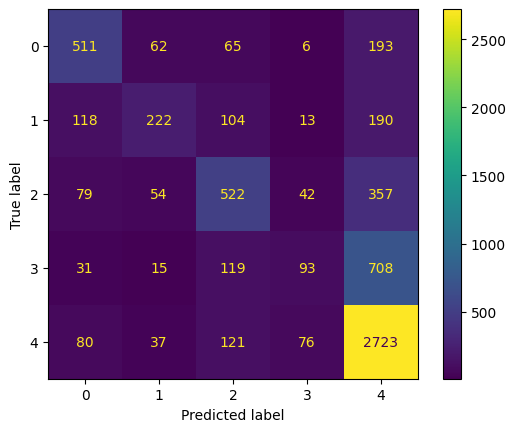

In [145]:
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test)

disp.plot()

In [144]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)

the review: Wandering with the Wapshots
the true rating: 3.0
the model rating: 5.0
the review: Definitely Not For Women!
the true rating: 1.0
the model rating: 3.0
the review: Storyline ....
the true rating: 5.0
the model rating: 3.0
the review: I Certainly Expected More . . .
the true rating: 1.0
the model rating: 5.0
the review: Highly recommended
the true rating: 4.0
the model rating: 5.0
the review: Not a good study guide
the true rating: 1.0
the model rating: 3.0
the review: Back to basics
the true rating: 2.0
the model rating: 5.0
the review: It might be easier to be green than you think!
the true rating: 3.0
the model rating: 5.0
the review: disappointing read
the true rating: 3.0
the model rating: 2.0
the review: just lost interest 3/4 way through
the true rating: 3.0
the model rating: 2.0
the review: a need to read Hamlet
the true rating: 5.0
the model rating: 3.0
the review: Disappointing
the true rating: 1.0
the model rating: 2.0
the review: What science fiction is all about

## Guess the ratings from the text reviews

In [ ]:
rating=dataset_rating

X = rating['review/text'].astype(str)

y = rating['review/score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

In [ ]:
tfidf_vectorizer = TfidfVectorizer()
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train)

# Vectoriser le dataset de test
X_test_tfidf = tfidf_vectorizer.transform(X_test)

In [ ]:
# SVM Model
svm_model = SVC(kernel='linear')
svm_model.fit(X_train_tfidf, y_train)

# Predicting on the training set
y_pred_train = svm_model.predict(X_train_tfidf)


# Displaying the classification report for the training data
classification_report = classification_report(y_train, y_pred_train)
print("Classification Report for Test Data:\n", classification_report)

In [ ]:
y_pred_test = svm_model.predict(X_test_tfidf)


conf_matrix_test = confusion_matrix(y_test, y_pred_test)

disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_test)

disp.plot()

In [ ]:
i=0
for y_pred_test1,y_test1,X_test1 in zip(y_pred_test,y_test,X_test):
    if(y_pred_test1 != y_test1):
        print("the review:",X_test1)
        print("the true rating:",y_test1)
        print("the model rating:",y_pred_test1)
        i+=1
print(i)